$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bb}[1]{\boldsymbol{#1}}
$$
# Part 6: YOLO - Objects Detection
<a id=part6></a>

In this part we will use an object detection architecture called YOLO (You only look once) to detect objects in images. We'll use an already trained model weights (v5) found here: https://github.com/ultralytics/yolov5

In [1]:
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the YOLO model
model = torch.hub.load("ultralytics/yolov5", "yolov5s")
model.to(device)
# Images
img1 = 'imgs/DolphinsInTheSky.jpg'  
img2 = 'imgs/cat-shiba-inu-2.jpg' 

Using cache found in /home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master


WARNING ⚠️ torchvision==0.20 is incompatible with torch==2.4.
Run 'pip install torchvision==0.19' to fix torchvision or 'pip install -U torch torchvision' to update both.
For a full compatibility table see https://github.com/pytorch/vision#installation


YOLOv5 🚀 2025-1-3 Python-3.8.12 torch-2.4.1 CUDA:0 (NVIDIA GeForce RTX 2080 Ti, 11012MiB)



Fusing layers... 


YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs


Adding AutoShape... 


## Inference with YOLO
<a id=part6_1></a>

You are provided with 2 images (img1 and img2).
**TODO**:
1. Detect objects using the YOLOv5 model for these 2 images.
2. Print the inference output with bounding boxes.
3. Look at the inference results and answer the question below.


/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


WARNING ⚠️ NMS time limit 0.550s exceeded


/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


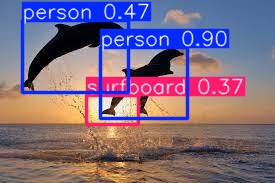

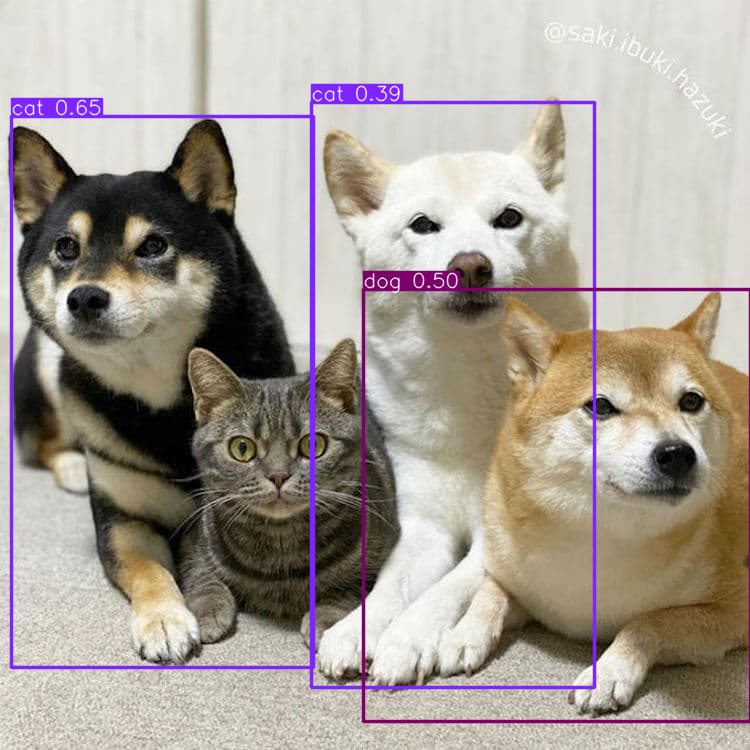

In [2]:
#Insert the inference code here.
with torch.no_grad():
    # Inference
    results1 = model(img1)
    results2 = model(img2)
    results1.show()  # Display image with bounding boxes for img1
    results2.show()  # Display image with bounding boxes for img2
    


In [3]:
from cs236781.answers import display_answer
import hw2.answers

### Question 1

Analyze the inference results of the 2 images. 
1. How well did the model detect the objects in the pictures? with what confidance?
2. What can possibly be the reason for the model failures? suggest methods to resolve that issue.
3. recall that we learned how to fool a model by adverserial attack (PGD), describe how you would attack an Object Detection model (such as YOLO).

In [4]:
display_answer(hw2.answers.part6_q1)



**Your answer:**

(1) The model didn't detect most of the objects correctly, and also most of the detections were given with low confidence.
    In the first picture, it both misclassified the upper dolphin and failed to draw the rectangle around the two 
    lower dolphines correctly (identified them as one person + surfboard).
    In the second image it failed to detect the cat as an object, and it also predicted 2 out of the 3 dogs as cats, with only one dog identified correctly.
    It only predicted with confidence higher than 0.65 the lower two-dolphins wrongly as person with 0.9 confidence.

(2) In the first image the model didn't recognize the dolphin, which means it might not have seen enough dolphines in the
    training set, so to resolve the issue we can add more dolphines to the training set, same deal with the dogs.
    Another issue the model has was to seperate overlapping objects (both with the dolphins and the dogs&cats), so to
    resolve this issue we can add more cluttered images with overlapping objects to the training set. Also, we can try training the 
    model on smaller segments of the image and allow the model to focus on the objects separately while training.


## Creative Detection Failures

<a id=part6_2></a>

Object detection pitfalls could be, for example: **occlusion** - when the objects are partially occlude, and thus missing important features, **model bias** - when a model learn some bias about an object, it could recognize it as something else in a different setup, and many others like **Deformation**, **Illumination conditions**, **Cluttered** or **textured background and blurring** due to moving objects.

**TODO**: Take pictures and that demonstrates 3 of the above object detection pitfalls, run inference and analyze the results.

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


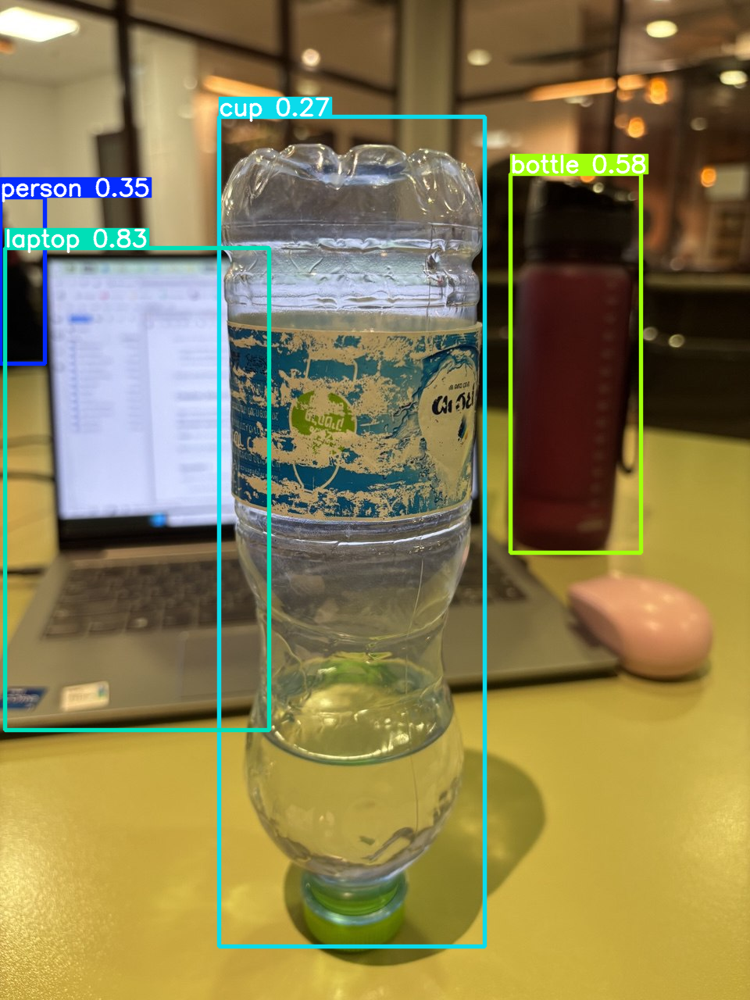

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


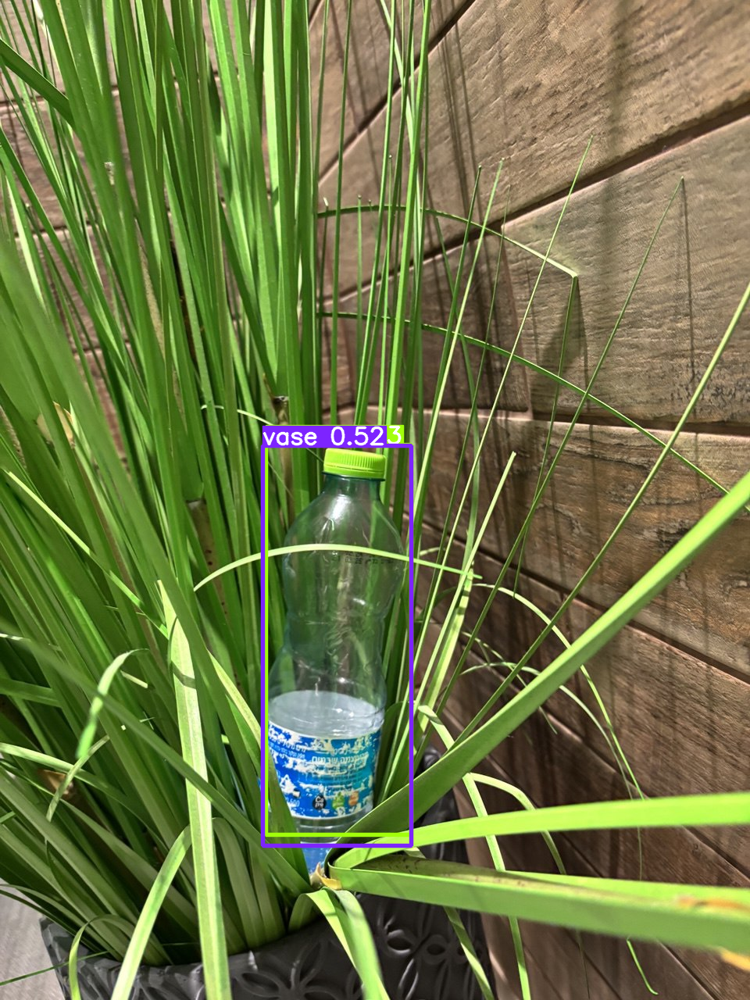

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


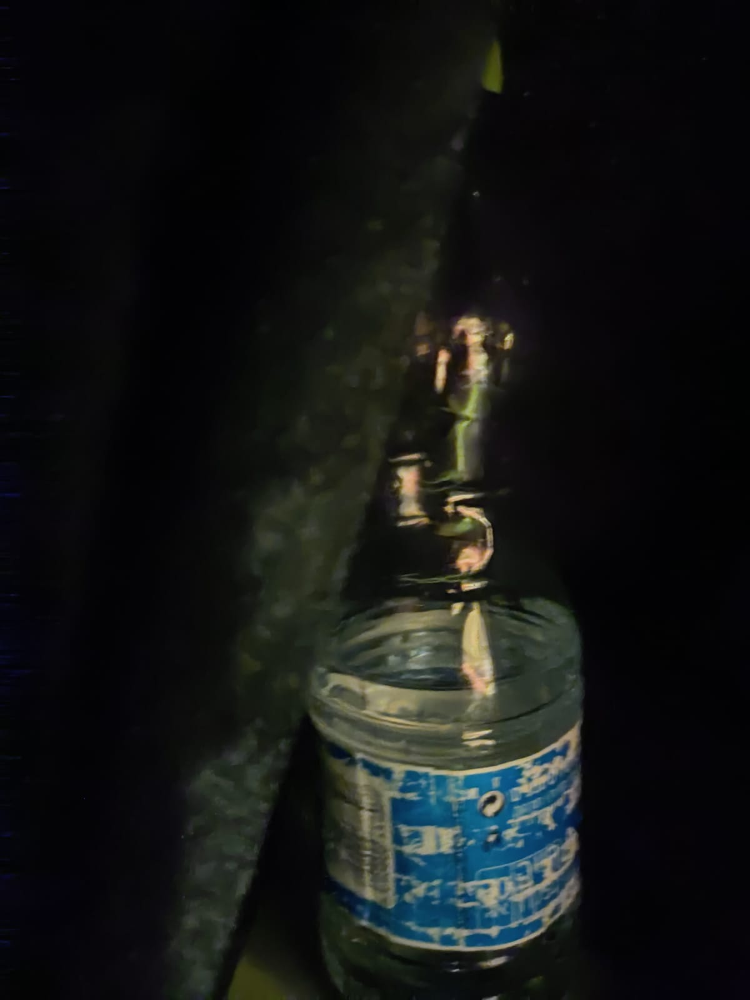

In [5]:
#Insert the inference code here.
img3 = 'imgs/flipped.jpg'  
img4 = 'imgs/plant.jpg' 
img5 = 'imgs/dark.jpg' 
with torch.no_grad():
    for img in [img3, img4, img5]:
        results1 = model(img)
        results1.show()  # Display image with bounding boxes for img


### Question 3

Analyize the results of the inference. 
1. How well did the model detect the objects in the pictures? explain.


In [6]:
display_answer(hw2.answers.part6_q3)



**Your answer:**
Our first image of the bottle (flipped) was misclassified as a cup, we estimate this has happened because mostly cups look similar - 
a solid bottom, and the rest transparent, bottles are mostly the other way around, with the cap at the top being solid

In our second image (plant) the bottle was misclassified as a vase, we believe it's because of the bottom with the label which makes
the bottom part of the bottle look solid, as well as the plant obstructing parts of the bottle, and being in a similar color as the cap

In our third image (dark) the bottle was not classified at all, the image was appreantly too dark


## Bonus 
<a id=part6_3></a>

Try improving the model performance over poorly recognized images by changing them. 
Describe the manipulations you did to the pictures.

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


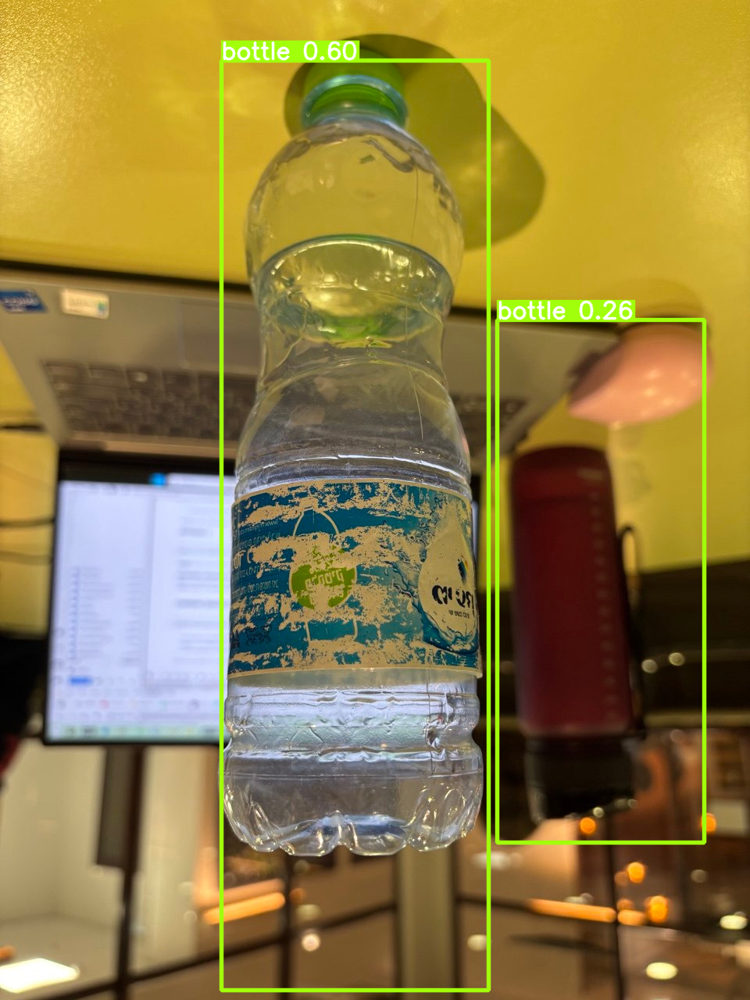

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


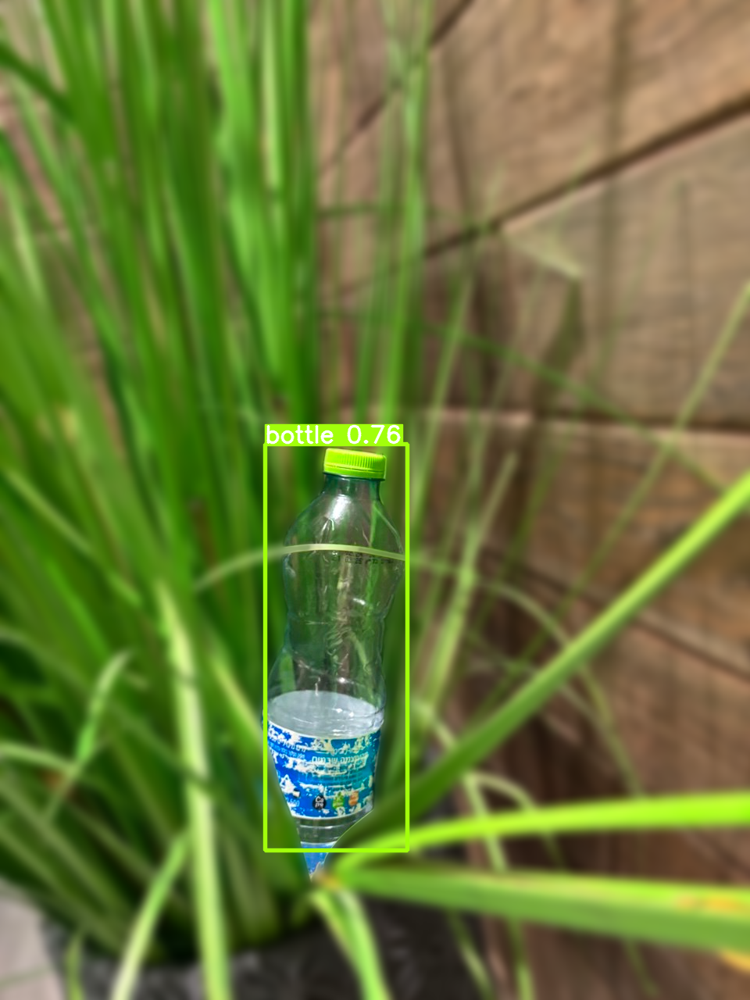

/home/avia.avraham/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


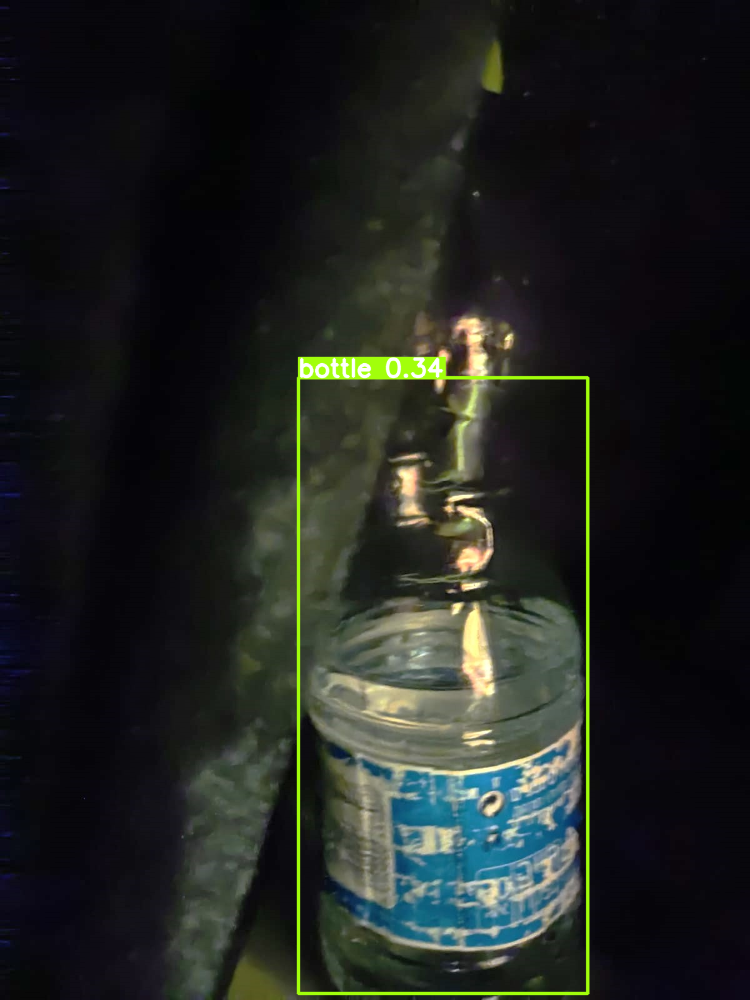

In [7]:
#insert bonus code here
img6 = 'imgs/flipped_flipped.jpg'  
img7 = 'imgs/plant_focused.png' 
img8 = 'imgs/dark2.jpg' 
with torch.no_grad():
    for img in [img6, img7, img8]:
        results1 = model(img)
        results1.show()  # Display image with bounding boxes for img

In [8]:
display_answer(hw2.answers.part6_bonus)



**Your answer:**
In the first image (flipped) we flipped upside-down the image, it fixed the issue we had earlier and the cap was on above the bottle
this time

In the second image (plant) we focused the subject of our image, the bottle, now the plant in the background didn't stop us from identifying it.

In the third image (dark) we simply brightened the image, this time we managed to identify the bottle
